In [1]:
# Add the repo root to the sys path for the model import below
import sys

sys.path.append("../..")

In [2]:
import sys
print(sys.path)


['/usr/local/lib/python311.zip', '/usr/local/lib/python3.11', '/usr/local/lib/python3.11/lib-dynload', '', '/usr/local/lib/python3.11/site-packages', '../..']


In [3]:
import math
import geopandas as gpd
import numpy as np
import pandas as pd
import pystac_client
import stackstac
import yaml
from box import Box
from matplotlib import pyplot as plt
from rasterio.enums import Resampling
from shapely import Point
from sklearn import decomposition, svm


In [4]:
# Point over my college
lat, lon = 17.54389, 78.57528

# recent dates
start = "2024-08-05"
end = "2025-08-05"

In [5]:
STAC_API = "https://earth-search.aws.element84.com/v1"
COLLECTION = "sentinel-2-l2a"

# Search the catalogue
catalog = pystac_client.Client.open(STAC_API)
search = catalog.search(
    collections=[COLLECTION],
    datetime=f"{start}/{end}",
    bbox=(lon - 1e-5, lat - 1e-5, lon + 1e-5, lat + 1e-5),
    max_items=100,
    query={"eo:cloud_cover": {"lt": 80}},
)

all_items = search.get_all_items()

# Reduce to one per date (there might be some duplicates
# based on the location)
items = []
dates = []
for item in all_items:
    if item.datetime.date() not in dates:
        items.append(item)
        dates.append(item.datetime.date())

print(f"Found {len(items)} items")

/usr/local/lib/python3.11/site-packages/pystac_client/item_search.py:940: FutureWarning: get_all_items() is deprecated, use item_collection() instead.
  warnings.warn(


Found 52 items


In [6]:
print(items[0].properties.keys())


dict_keys(['created', 'platform', 'constellation', 'instruments', 'eo:cloud_cover', 'proj:centroid', 'mgrs:utm_zone', 'mgrs:latitude_band', 'mgrs:grid_square', 'grid:code', 'view:azimuth', 'view:incidence_angle', 'view:sun_azimuth', 'view:sun_elevation', 's2:tile_id', 's2:degraded_msi_data_percentage', 's2:nodata_pixel_percentage', 's2:saturated_defective_pixel_percentage', 's2:cloud_shadow_percentage', 's2:vegetation_percentage', 's2:not_vegetated_percentage', 's2:water_percentage', 's2:unclassified_percentage', 's2:medium_proba_clouds_percentage', 's2:high_proba_clouds_percentage', 's2:thin_cirrus_percentage', 's2:snow_ice_percentage', 's2:product_type', 's2:processing_baseline', 's2:product_uri', 's2:generation_time', 's2:datatake_id', 's2:datatake_type', 's2:datastrip_id', 's2:reflectance_conversion_factor', 'datetime', 's2:sequence', 'earthsearch:s3_path', 'earthsearch:payload_id', 'earthsearch:boa_offset_applied', 'processing:software', 'updated', 'proj:code'])


In [7]:
import pyproj
pyproj.datadir.set_data_dir("/home/yash/miniconda3/envs/claymodel/share/proj")#THIS IS THE PATH TO YOUR PROJ DATA DIRECTORY, RESOLVES A COMMON ERROR WHEN USING PROJ LIBRARY

from pyproj import CRS
print(CRS.from_epsg(4326))


EPSG:4326


In [8]:
# Extract coordinate system from first item
epsg = items[0].properties["proj:code"]
print(f"Using EPSG code: {epsg}")

# Convert point of interest into the image projection
# (assumes all images are in the same projection)
poidf = gpd.GeoDataFrame(
    pd.DataFrame(),
    crs="EPSG:4326",
    geometry=[Point(lon, lat)],
).to_crs(epsg)

coords = poidf.iloc[0].geometry.coords[0]

# Create bounds in projection
size = 256
gsd = 10
bounds = (
    coords[0] - (size * gsd) // 2,
    coords[1] - (size * gsd) // 2,
    coords[0] + (size * gsd) // 2,
    coords[1] + (size * gsd) // 2,
)

Using EPSG code: EPSG:32644


In [9]:
# Retrieve the pixel values, for the bounding box in
# the target projection. In this example we use only
# the RGB and NIR bands.
epsg = items[0].properties["proj:code"].split(":")[-1]
stack = stackstac.stack(
    items,
    bounds=bounds,
    snap_bounds=False,
    epsg=int(epsg),
    resolution=gsd,
    dtype="float64",#this has been changed from "float32" to "float64" to avoid overflow issues
    rescale=False,
    fill_value=0.0,#and this from 0 to 0.0 to avoid overflow issues
    assets=["blue", "green", "red", "nir"],
    resampling=Resampling.nearest,
)

print(stack)

stack = stack.compute()

<xarray.DataArray 'stackstac-70b8b81893e6b52864c43624a94be170' (time: 52,
                                                                band: 4,
                                                                y: 256, x: 256)> Size: 109MB
dask.array<fetch_raster_window, shape=(52, 4, 256, 256), dtype=float64, chunksize=(1, 1, 256, 256), chunktype=numpy.ndarray>
Coordinates: (12/51)
  * time                                     (time) datetime64[ns] 416B 2024-...
    id                                       (time) <U24 5kB 'S2B_43QHV_20240...
  * band                                     (band) <U5 80B 'blue' ... 'nir'
  * x                                        (x) float64 2kB 2.413e+05 ... 2....
  * y                                        (y) float64 2kB 1.943e+06 ... 1....
    mgrs:utm_zone                            (time) int64 416B 43 43 ... 44 44
    ...                                       ...
    s2:tile_id                               (time) object 416B None ... 'S2C...
   

In [12]:
print(stack)
print(stack.dims)
print(stack.coords)


<xarray.DataArray 'stackstac-70b8b81893e6b52864c43624a94be170' (time: 52,
                                                                band: 4,
                                                                y: 256, x: 256)> Size: 109MB
array([[[[  888.,   844.,   866., ...,  3312.,  3152.,  3020.],
         [  826.,   778.,   846., ...,  1972.,  2186.,  2220.],
         [  812.,   772.,   841., ...,  1368.,  1302.,  1242.],
         ...,
         [ 1224.,  1136.,  1100., ..., 13552., 14040., 14296.],
         [ 1366.,  1236.,  1174., ..., 13448., 13888., 14080.],
         [ 1264.,  1266.,  1344., ..., 13280., 13848., 14080.]],

        [[ 1160.,  1100.,  1106., ...,  3564.,  3768.,  3356.],
         [ 1068.,  1006.,  1098., ...,  2136.,  2204.,  2062.],
         [  980.,   920.,  1074., ...,  1476.,  1504.,  1406.],
         ...,
         [ 1428.,  1376.,  1318., ..., 12224., 12792., 13048.],
         [ 1610.,  1488.,  1438., ..., 12264., 12656., 12888.],
         [ 1448.,  1598., 

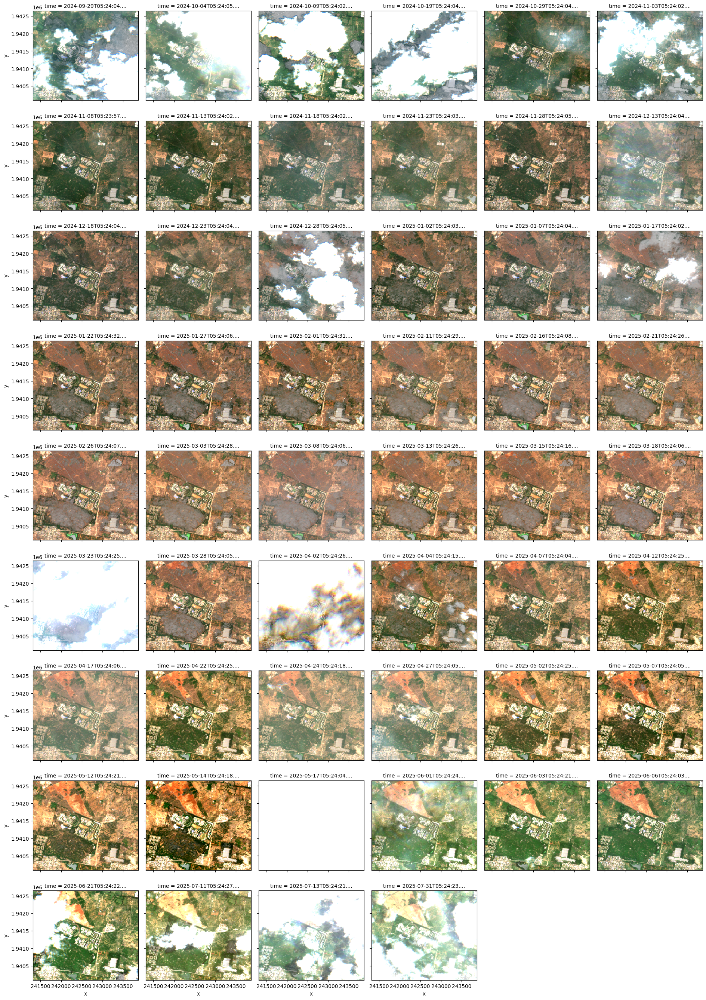

In [14]:
stack.sel(band=["red", "green", "blue","nir"]).plot.imshow(
    row="time", rgb="band", vmin=0, vmax=2000, col_wrap=6
)

In [ ]:
#POST THIS POINT WE USE THESE IMAGES FOR INFERENCING



In [21]:
from torchvision.transforms import v2 
import torch
from claymodel.module import ClayMAEModule

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
ckpt = "clay-v1.5.ckpt"
torch.set_default_device(device)

model = ClayMAEModule.load_from_checkpoint(
    ckpt,
    model_size="large",
    metadata_path="../../configs/metadata.yaml",
    dolls=[16, 32, 64, 128, 256, 768, 1024],
    doll_weights=[1, 1, 1, 1, 1, 1, 1],
    mask_ratio=0.0,
    shuffle=False,
)
model.eval()

model = model.to(device)

In [ ]:
# Extract mean, std, and wavelengths from metadata
platform = "sentinel-2-l2a"
metadata = Box(yaml.safe_load(open("../../configs/metadata.yaml")))
mean = []
std = []
waves = []
# Use the band names to get the correct values in the correct order.
for band in stack.band:
    mean.append(metadata[platform].bands.mean[str(band.values)])
    std.append(metadata[platform].bands.std[str(band.values)])
    waves.append(metadata[platform].bands.wavelength[str(band.values)])

# Prepare the normalization transform function using the mean and std values.
transform = v2.Compose(
    [
        v2.Normalize(mean=mean, std=std),
    ]
)

In [ ]:
# Prep datetimes embedding using a normalization function from the model code.
def normalize_timestamp(date):
    week = date.isocalendar().week * 2 * np.pi / 52
    hour = date.hour * 2 * np.pi / 24

    return (math.sin(week), math.cos(week)), (math.sin(hour), math.cos(hour))


datetimes = stack.time.values.astype("datetime64[s]").tolist()
times = [normalize_timestamp(dat) for dat in datetimes]
week_norm = [dat[0] for dat in times]
hour_norm = [dat[1] for dat in times]


# Prep lat/lon embedding using the
def normalize_latlon(lat, lon):
    lat = lat * np.pi / 180
    lon = lon * np.pi / 180

    return (math.sin(lat), math.cos(lat)), (math.sin(lon), math.cos(lon))


latlons = [normalize_latlon(lat, lon)] * len(times)
lat_norm = [dat[0] for dat in latlons]
lon_norm = [dat[1] for dat in latlons]

# Normalize pixels
pixels = torch.from_numpy(stack.data.astype(np.float32))
pixels = transform(pixels)

In [ ]:
# Prep datetimes embedding using a normalization function from the model code.
def normalize_timestamp(date):
    week = date.isocalendar().week * 2 * np.pi / 52
    hour = date.hour * 2 * np.pi / 24

    return (math.sin(week), math.cos(week)), (math.sin(hour), math.cos(hour))


datetimes = stack.time.values.astype("datetime64[s]").tolist()
times = [normalize_timestamp(dat) for dat in datetimes]
week_norm = [dat[0] for dat in times]
hour_norm = [dat[1] for dat in times]


# Prep lat/lon embedding using the
def normalize_latlon(lat, lon):
    lat = lat * np.pi / 180
    lon = lon * np.pi / 180

    return (math.sin(lat), math.cos(lat)), (math.sin(lon), math.cos(lon))


latlons = [normalize_latlon(lat, lon)] * len(times)
lat_norm = [dat[0] for dat in latlons]
lon_norm = [dat[1] for dat in latlons]

# Normalize pixels
pixels = torch.from_numpy(stack.data.astype(np.float32))
pixels = transform(pixels)

In [ ]:
# Prepare additional information
datacube = {
    "platform": platform,
    "time": torch.tensor(
        np.hstack((week_norm, hour_norm)),
        dtype=torch.float32,
        device=device,
    ),
    "latlon": torch.tensor(
        np.hstack((lat_norm, lon_norm)), dtype=torch.float32, device=device
    ),
    "pixels": pixels.to(device),
    "gsd": torch.tensor(stack.gsd.values, device=device),
    "waves": torch.tensor(waves, device=device),
}

In [ ]:
with torch.no_grad():
    unmsk_patch, unmsk_idx, msk_idx, msk_matrix = model.model.encoder(datacube)

# The first embedding is the class token, which is the
# overall single embedding. We extract that for PCA below.
embeddings = unmsk_patch[:, 0, :].cpu().numpy()

In [ ]:
# Run PCA
pca = decomposition.PCA(n_components=1)
pca_result = pca.fit_transform(embeddings)

plt.xticks(rotation=-45)

# Plot all points in blue first
plt.scatter(stack.time, pca_result, color="blue")

# Re-plot cloudy images in green
plt.scatter(stack.time[0], pca_result[0], color="green")
plt.scatter(stack.time[2], pca_result[2], color="green")

# Color all images after fire in red
plt.scatter(stack.time[-5:], pca_result[-5:], color="red")